In [24]:
import os
import pandas as pd
import numpy as np
import cv2

# library for mobilenet to get embeddings
from tensorflow.keras.applications.mobilenet import MobileNet, preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras import layers
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model

# library for similarities calculation
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial import distance

# library for plotting image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import plotly.express as px

# library for TSNE
from sklearn.manifold import TSNE

In [2]:
#project_path = r"D:\adham-till-code"
project_path = os.getcwd()

In [3]:
os.getcwd()

'C:\\Users\\Asus\\Desktop\\Project\\ImageRecommender'

In [4]:
data = pd.read_pickle(os.path.join(project_path, 'file_path.pkl'))
color = pd.read_pickle(os.path.join(project_path,'color_histogram.pkl'))
df = pd.read_pickle(os.path.join(project_path,'embeddings.pkl'))

In [5]:
len(data)

31940

In [6]:
data.head()

,file_path
image_id,
0000000_,\Users\Asus\Desktop\Project\ImageRecommender\w...
0000001_,\Users\Asus\Desktop\Project\ImageRecommender\w...
0000002_,\Users\Asus\Desktop\Project\ImageRecommender\w...
0000003_,\Users\Asus\Desktop\Project\ImageRecommender\w...
0000004_,\Users\Asus\Desktop\Project\ImageRecommender\w...


## measure similarity

In [7]:
def calculate_similarity(dataframe, img_to_compare, img_input=False):
    """
    This function is used to calculate the euclidean distance of the images
    """
    arr = np.array([])
    
    # if we have input image or not
    if img_input == True:
        v1 = img_to_compare # change this
    else:
        v1 = np.array(dataframe.loc[img_to_compare, :])
    for idx in dataframe.index:
        v2 = np.array(dataframe.loc[idx, :])
        arr = np.append(arr, distance.euclidean(v1, v2))
    # sort the idx from highest to lowest value
    sorted_index = np.argsort(arr)
    return sorted_index

In [8]:
def plot_images(file_paths, title):
    """
    This function is used to plot the 9 similar images, that similar to the input image from
    the similarities function
    """
    num_images = len(file_paths)
    num_rows = 2
    num_cols = (num_images + 1) // 2  # Calculate the number of columns based on the number of images

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 6))

    for i, ax in enumerate(axes.flat):
        if i < num_images:
            try:
                img = mpimg.imread(file_paths[i])
                ax.imshow(img)
                ax.axis('off')
                if i == 0:  # Add a border for the first image
                    ax.set_title("Input Image")
            except IOError:
                print(f"Unable to open image file: {file_paths[i]}")
        else:
            ax.axis('off')  # Hide unused subplot
    
    fig.suptitle(title, fontsize=20)
    
    plt.tight_layout()
    plt.show()

In [9]:
def top_path(paths, sorted_index, n_path=10):
    """
    This function is used to get the file paths from the given image ids
    """
    file_paths = []
    for i in sorted_index:
        idx = f"{i:07}_"
        img_path = paths.loc[idx]["file_path"]
        file_paths.append(img_path)
    # return only desired n number of paths.
    return file_paths[:n_path] 

In [10]:
def get_path_from_drive(path, pc="windows", drive="None",):
    """
    This function is used for getting path for either windows or macbook
    """ 
    if pc == "windows":
        if drive == "None":
            return "Please check your drive path again"
        return drive + path
        
    elif pc == "apple":
        if drive == "None":
            return "Please check your drive name"
        return "/Volumes/" + drive + path
    else:
        return "Please choose correct PC. Either windows or apple"

In [11]:
# compare image from one id
number = 6860
image_id = f"{number:07}_"

# calculate the similarities, and sort by high to low
color_similarity = calculate_similarity(color, image_id)
embeddings_similarity = calculate_similarity(df, image_id)

In [12]:
# get the index of top 10 similar images
top_color = top_path(data, color_similarity, n_path=10)
top_embeddings = top_path(data, embeddings_similarity, n_path=10)

In [13]:
# EXTRA: adjust the path, so that it matches with both system, windows or mac
top_color = [get_path_from_drive(path, pc="windows", drive="C:") for path in top_color]
top_embeddings = [get_path_from_drive(path, pc="windows", drive="C:") for path in top_embeddings]

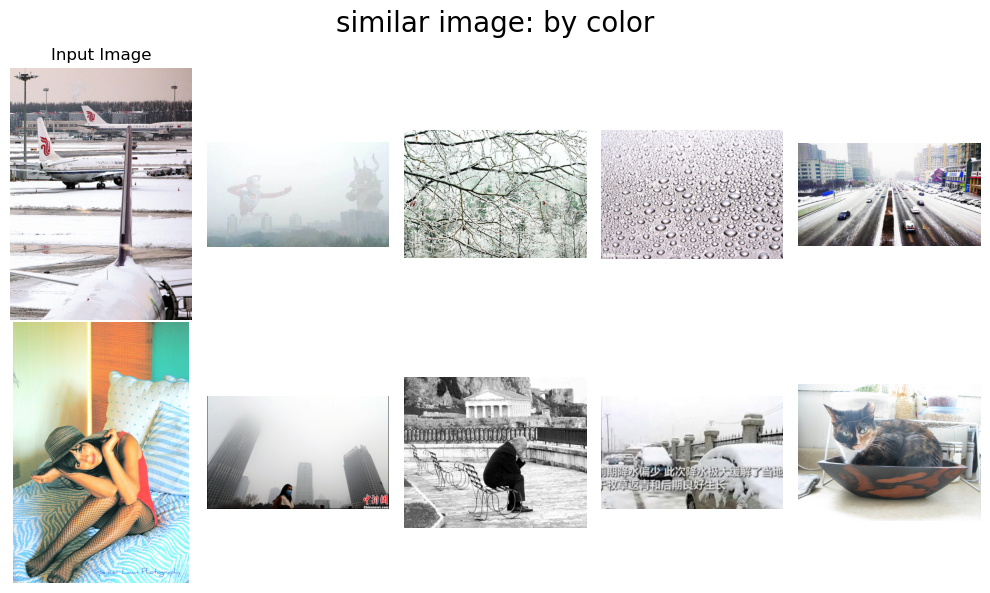

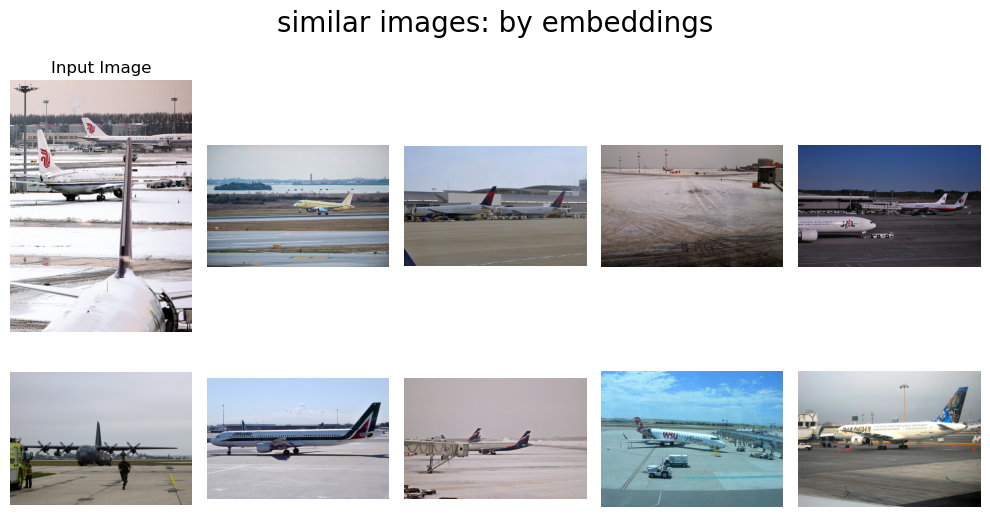

In [14]:
# plot the images
plot_images(top_color, "similar image: by color")
plot_images(top_embeddings, "similar images: by embeddings")

## compare with input images

In [30]:
# preprocess the input image
def get_colour_hist(image):
    """
    This function is used to calculate color histogram for image
    """
    red_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 2]

    # Calculate colour histogram
    red_hist = cv2.calcHist([red_channel], [0], None, [30], [0, 256])
    green_hist = cv2.calcHist([green_channel], [0], None, [30], [0, 256])
    blue_hist = cv2.calcHist([blue_channel], [0], None, [30], [0, 256])

    # Normalize the colour histogram value
    red_hist = cv2.normalize(red_hist, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    green_hist = cv2.normalize(green_hist, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    blue_hist = cv2.normalize(blue_hist, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

    return red_hist, green_hist, blue_hist

def get_embeddings(image):
    # Load the pre-trained MobileNet model
    base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

    x = base_model.output
    embeddings = layers.GlobalAveragePooling2D()(x) # layer before output

    model = Model(base_model.input, embeddings)
    
    # Load and preprocess the image
    img = load_img(image, target_size=(224, 224))
    x = img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    
    # get the embeddings
    embedding = model.predict(x)
    return embedding.flatten()

In [36]:
img_em = get_embeddings(r"C:\Users\Asus\Downloads\test_image.jpg")
print(img_em)
calculate_similarity(df, img_em, img_input=True)[:10]

1/1 [==============================] - 0s 483ms/step
[0.5670326  0.         0.2910109  ... 0.31719312 1.1675928  0.47719356]


array([20174, 31690,   749, 19298,   389,  1127, 28161, 11566,  1388,
         967], dtype=int64)

In [34]:
def ImageRecommender(input_image):    
    # read the image using cv2
    img = cv2.imread(input_image)
    if img is None:
        return "This image cannot be loaded properly"
    
    img_rgb = get_colour_hist(img)
    img_em = get_embeddings(input_image)
    
    # merged the list from RGB channel into one list
    merged_list = np.concatenate((img_rgb[0], img_rgb[1], img_rgb[2]), axis=1).flatten().tolist()
    
    # calculate similarities
    color_similarity = calculate_similarity(color, merged_list, img_input=True)
    embeddings_similarity = calculate_similarity(df, img_em, img_input=True)
    
    top_color = top_path(data, color_similarity, n_path=5)
    top_embeddings = top_path(data, embeddings_similarity, n_path=5)
    
    top_color = [input_image]+[get_path_from_drive(path, pc="windows", drive="C:") for path in top_color]
    top_embeddings = [input_image] + [get_path_from_drive(path, pc="windows", drive="C:") for path in top_embeddings]
    
    plot_images(top_color, "similar images: by color")
    plot_images(top_embeddings, "similar images: by embeddings")
    
    #return merged_list

1/1 [==============================] - 0s 409ms/step


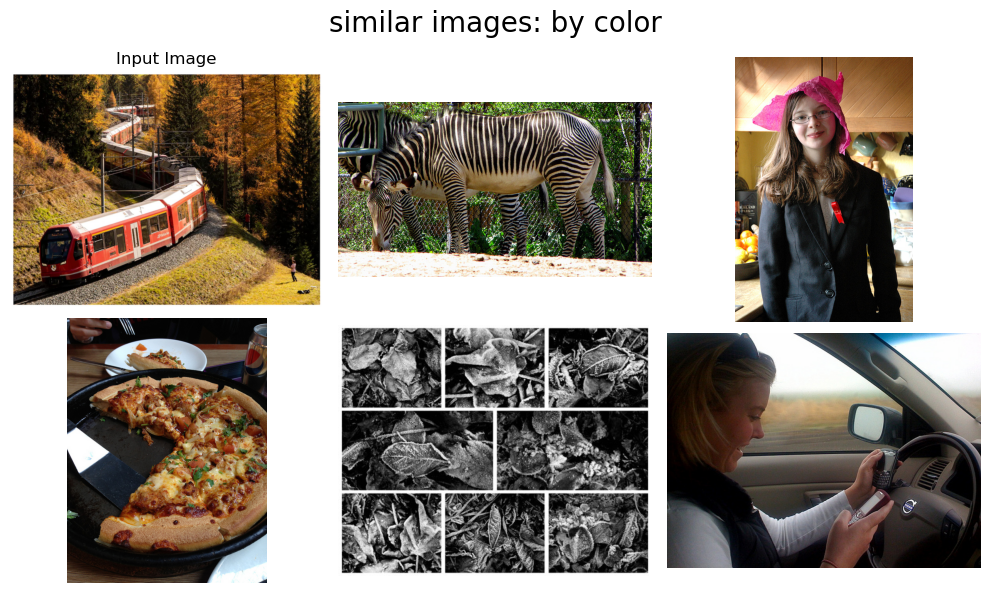

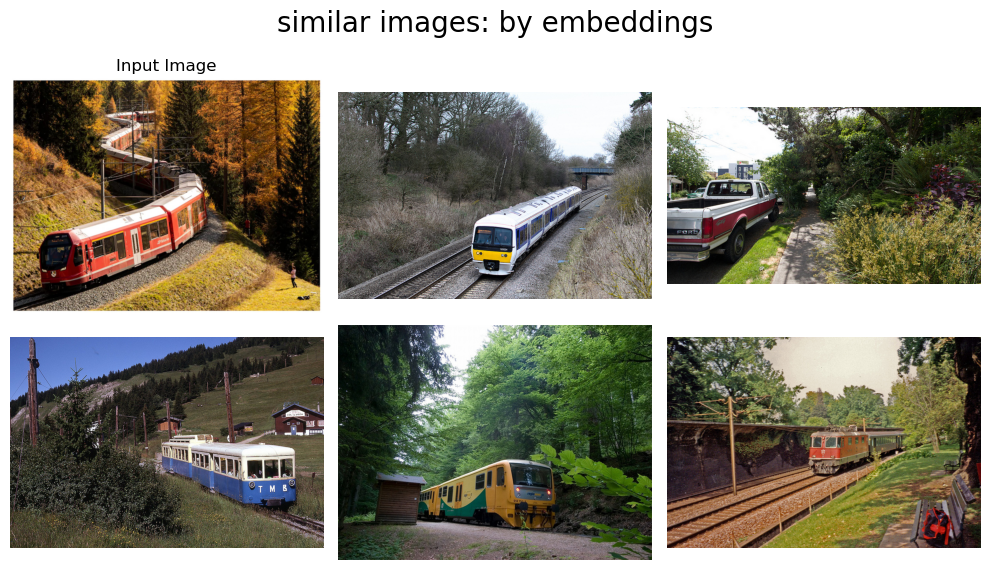

In [38]:
ImageRecommender(r"C:\Users\Asus\Downloads\train-test.jpg")

## TSNE

In [40]:
# Apply t-SNE to the dataset
tsne = TSNE(n_components=2, init="pca",
            perplexity=30,
            random_state=42)
X_tsne = tsne.fit_transform(df)

# Create a DataFrame from the t-SNE results
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])

# Save t-SNE results to a CSV file
df_tsne.to_csv('tsne_results.csv', index=False)

TypeError: to_pickle() got an unexpected keyword argument 'index'

In [41]:
df_tsne.to_pickle('tsne_results.pkl')

In [11]:
# load the csv, if the results is saved before
df_tsne = pd.read_csv('tsne_results.csv')

In [9]:
df_tsne = pd.read_pickle('tsne_results.pkl')

In [14]:
df_tsne = df_tsne.set_index(df.index)

In [42]:
# data preparation for tsne plots
data['class_'] = data['file_path'].str.split('\\').str[-2]

# convert class name to number for tsne plot
class_mapping = dict()
counter = 0
for item in list(set(data.class_)):
    class_mapping[item] = counter
    counter += 1

data['class_num'] = data['class_'].map(class_mapping)
data.head()

,file_path,mac_path,class_,class_num
image_id,,,,
0000000_,C:\Users\Asus\Desktop\Project\ImageRecommender...,/Users/Asus/Desktop/Project/ImageRecommender/w...,dew,7
0000001_,C:\Users\Asus\Desktop\Project\ImageRecommender...,/Users/Asus/Desktop/Project/ImageRecommender/w...,dew,7
0000002_,C:\Users\Asus\Desktop\Project\ImageRecommender...,/Users/Asus/Desktop/Project/ImageRecommender/w...,dew,7
0000003_,C:\Users\Asus\Desktop\Project\ImageRecommender...,/Users/Asus/Desktop/Project/ImageRecommender/w...,dew,7
0000004_,C:\Users\Asus\Desktop\Project\ImageRecommender...,/Users/Asus/Desktop/Project/ImageRecommender/w...,dew,7


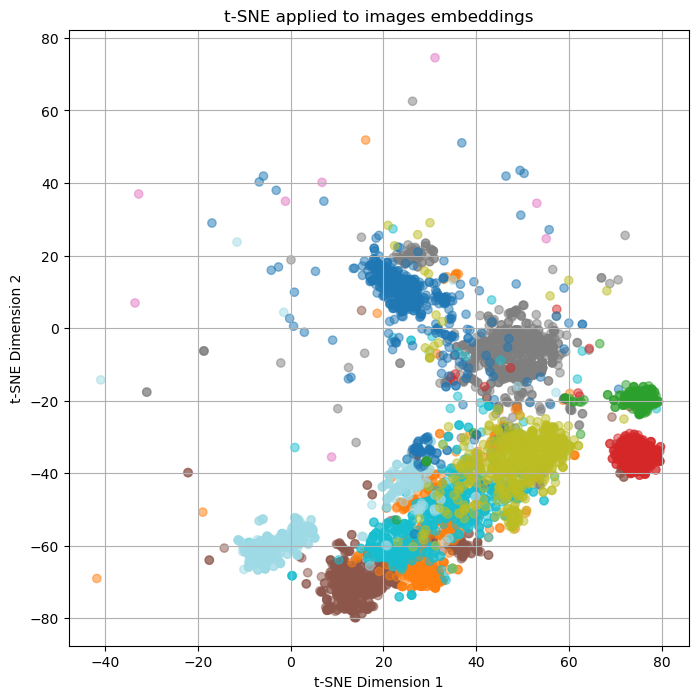

In [43]:
# Visualize the t-SNE results

fig, ax = plt.subplots(figsize=(8, 8))
ax.scatter(df_tsne.iloc[:5000, 0], df_tsne.iloc[:5000, 1],
           c=data.class_num.values[:5000], #loss last 32 images
           cmap='tab20', alpha=0.5)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.title("t-SNE applied to images embeddings")
plt.grid(True)
plt.show()

In [44]:
# plotly plot

fig = px.scatter(
    df_tsne, x='TSNE1', y='TSNE2',
    color=data.class_, labels={'color': 'class_'},
    opacity=0.5
)
fig.show()